In [6]:
from datetime import date
import numpy as np
import mne as mne
import matplotlib.pyplot as plt

ELECTRODES_NUM = 35

# today = date.today().strftime("%b-%d-%Y")
# root_folder = f"data/{today}"
root_folder = r"C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th"
file_ext = ".set"

In [2]:
# Fetch the data from the .set file
base_removed_eeglab_epochs = mne.io.read_epochs_eeglab(root_folder + r'\base_removed_short_35_electrodes_filtered_epoched_locations.set')
eeglab_epochs = mne.io.read_epochs_eeglab(root_folder + r'\short_35_electrodes_filtered_epoched_locations.set')

# Create the train set and test set
total_num_of_epochs = len(eeglab_epochs)

train_set_indexes = []
test_set_indexes = []
for i in range(total_num_of_epochs):
    random_num = np.random.rand()
    if (random_num < 0.8):  # 80% chance of being here
        train_set_indexes.append(i)
    else:
        test_set_indexes.append(i)

train_set = eeglab_epochs[train_set_indexes]
test_set = eeglab_epochs[test_set_indexes]
base_removed_train_set = base_removed_eeglab_epochs[train_set_indexes]
base_removed_test_set = base_removed_eeglab_epochs[test_set_indexes]

print(f"Total number of Epochs: {total_num_of_epochs}")
print(f"Train set size: {len(train_set)}")
print(f"Test set size: {len(test_set)}")

Extracting parameters from C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\base_removed_short_35_electrodes_filtered_epoched_locations.set...
Not setting metadata
462 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\short_35_electrodes_filtered_epoched_locations.set...
Not setting metadata
462 matching events found
No baseline correction applied
0 projection items activated
Ready.
Total number of Epochs: 462
Train set size: 368
Test set size: 94


In [4]:
# Export the Data
mne.export.export_epochs(root_folder + r'\train_set.set', train_set, overwrite=True)
mne.export.export_epochs(root_folder + r'\test_set.set', test_set, overwrite=True)
mne.export.export_epochs(root_folder + r'\base_removed_train_set.set', base_removed_train_set, overwrite=True)
mne.export.export_epochs(root_folder + r'\base_removed_test_set.set', base_removed_test_set, overwrite=True)

In [10]:
# Import the data
train_set = mne.io.read_epochs_eeglab(root_folder + r'\train_set.set')
test_set = mne.io.read_epochs_eeglab(root_folder + r'\test_set.set')
base_removed_train_set = mne.io.read_epochs_eeglab(root_folder + r'\base_removed_train_set.set')
base_removed_test_set = mne.io.read_epochs_eeglab(root_folder + r'\base_removed_test_set.set')

train_set_left = train_set['Left']
train_set_right = train_set['Right']
train_set_no_move = train_set['NoMove']

base_removed_train_set_left = base_removed_train_set['Left']
base_removed_train_set_right = base_removed_train_set['Right']
base_removed_train_set_no_move = base_removed_train_set['NoMove']

test_set_left = test_set['Left']
test_set_right = test_set['Right']
test_set_no_move = test_set['NoMove']

base_removed_test_set_left = base_removed_test_set['Left']
base_removed_test_set_right = base_removed_test_set['Right']
base_removed_test_set_no_move = base_removed_test_set['NoMove']

Extracting parameters from C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\train_set.set...
Not setting metadata
369 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\test_set.set...
Not setting metadata
93 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\base_removed_train_set.set...
Not setting metadata
369 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\base_removed_test_set.set...
Not setting metadata
93 matching events found
No baseline correction applied
0 proj

In [20]:
# Trim the data
trimmed_train_set = train_set.copy().crop(tmin=0.1, tmax=0.7)
trimmed_test_set = test_set.copy().crop(tmin=0.1, tmax=0.7)
trimmed_base_removed_train_set = train_set.copy().crop(tmin=0.1, tmax=0.7)
trimmed_base_removed_test_set = test_set.copy().crop(tmin=0.1, tmax=0.7)

trimmed_train_set_left = trimmed_train_set['Left']
trimmed_train_set_right = trimmed_train_set['Right']
trimmed_train_set_no_move = trimmed_train_set['NoMove']

trimmed_base_removed_train_set_left = trimmed_base_removed_train_set['Left']
trimmed_base_removed_train_set_right = trimmed_base_removed_train_set['Right']
trimmed_base_removed_train_set_no_move = trimmed_base_removed_train_set['NoMove']

trimmed_test_set_left = trimmed_test_set['Left']
trimmed_test_set_right = trimmed_test_set['Right']
trimmed_test_set_no_move = trimmed_test_set['NoMove']

trimmed_base_removed_test_set_left = trimmed_base_removed_test_set['Left']
trimmed_base_removed_test_set_right = trimmed_base_removed_test_set['Right']
trimmed_base_removed_test_set_no_move = trimmed_base_removed_test_set['NoMove']

In [6]:
# Create labels
trimmed_train_labels_left = np.full((len(trimmed_train_set_left.selection)),1)
trimmed_train_labels_right = np.full((len(trimmed_train_set_right.selection)),2)
trimmed_train_labels_no_move = np.full((len(trimmed_train_set_no_move.selection)),3)
trimmed_train_labels = np.concatenate((trimmed_train_labels_left, trimmed_train_labels_right, trimmed_train_labels_no_move))
np.save(root_folder + r'\trimmed_train_labels.npy', trimmed_train_labels)

trimmed_test_labels_left = np.full((len(trimmed_test_set_left.selection)),1)
trimmed_test_labels_right = np.full((len(trimmed_test_set_right.selection)),2)
trimmed_test_labels_no_move = np.full((len(trimmed_test_set_no_move.selection)),3)
trimmed_test_labels = np.concatenate((trimmed_test_labels_left, trimmed_test_labels_right, trimmed_test_labels_no_move))
np.save(root_folder + r'\trimmed_test_labels.npy', trimmed_test_labels)

In [ ]:
# Fit ICA on data that **WAS NOT** baseline removed
train_ica = mne.preprocessing.ICA(n_components = ELECTRODES_NUM, method='picard')
train_ica.fit(train_set)

test_ica = mne.preprocessing.ICA(n_components = ELECTRODES_NUM, method='picard')
test_ica.fit(train_set)

train_ica.save(root_folder + r'\train_ica.fif')
test_ica.save(root_folder + r'\test_ica.fif')

In [23]:
# Fit ICA on trimmed data
trimmed_train_ica = mne.preprocessing.ICA(n_components = ELECTRODES_NUM, method='picard')
trimmed_train_ica.fit(trimmed_train_set)

# trimmed_test_ica = mne.preprocessing.ICA(n_components = ELECTRODES_NUM, method='picard')
# trimmed_test_ica.fit(trimmed_train_set)

# trimmed_train_ica.save(root_folder + r'\trimmed_train_ica.fif')
# trimmed_test_ica.save(root_folder + r'\trimmed_test_ica.fif')

Fitting ICA to data using 35 channels (please be patient, this may take a while)


C:\Users\alonb\AppData\Local\Temp\ipykernel_8076\1761698328.py:3: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  trimmed_train_ica.fit(trimmed_train_set)


Selecting by number: 35 components
Fitting ICA took 11.4s.
Fitting ICA to data using 35 channels (please be patient, this may take a while)


C:\Users\alonb\AppData\Local\Temp\ipykernel_8076\1761698328.py:6: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  trimmed_test_ica.fit(trimmed_train_set)


Selecting by number: 35 components
Fitting ICA took 11.9s.


Method,picard
Fit,103 iterations on epochs (111069 samples)
ICA components,35
Explained variance,100.0 %
Available PCA components,35
Channel types,eeg
ICA components marked for exclusion,—


In [15]:
# Use data that was baseline removed
train_left_reconstructed = []
train_right_reconstructed = []
train_no_move_reconstructed = []
for i in range(ELECTRODES_NUM):
    train_left_reconstructed.append(train_ica.apply(base_removed_train_set_left.copy(), include=i).get_data())
    train_right_reconstructed.append(train_ica.apply(base_removed_train_set_right.copy(), include=i).get_data())
    train_no_move_reconstructed.append(train_ica.apply(base_removed_train_set_no_move.copy(), include=i).get_data())
train_left_reconstructed = np.mean(np.array(train_left_reconstructed), axis = 1)
train_right_reconstructed = np.mean(np.array(train_right_reconstructed), axis = 1)
train_no_move_reconstructed = np.mean(np.array(train_no_move_reconstructed), axis = 1)

train_left_ICs = np.swapaxes(train_ica.get_sources(base_removed_train_set_left).get_data(), 0, 1)
train_right_ICs = np.swapaxes(train_ica.get_sources(base_removed_train_set_right).get_data(), 0, 1)
train_no_move_ICs = np.swapaxes(train_ica.get_sources(base_removed_train_set_no_move).get_data(), 0, 1)

train_ICs = np.concatenate((train_left_ICs, train_right_ICs, train_no_move_ICs), axis = 1)

np.save(root_folder + r'\train_ICs.npy', train_ICs)


# Use data that was baseline removed
test_left_reconstructed = []
test_right_reconstructed = []
test_no_move_reconstructed = []
for i in range(ELECTRODES_NUM):
    test_left_reconstructed.append(test_ica.apply(base_removed_test_set_left.copy(), include=i).get_data())
    test_right_reconstructed.append(test_ica.apply(base_removed_test_set_right.copy(), include=i).get_data())
    test_no_move_reconstructed.append(test_ica.apply(base_removed_test_set_no_move.copy(), include=i).get_data())
test_left_reconstructed = np.mean(np.array(test_left_reconstructed), axis = 1)
test_right_reconstructed = np.mean(np.array(test_right_reconstructed), axis = 1)
test_no_move_reconstructed = np.mean(np.array(test_no_move_reconstructed), axis = 1)

test_left_ICs = np.swapaxes(test_ica.get_sources(base_removed_test_set_left).get_data(), 0, 1)
test_right_ICs = np.swapaxes(test_ica.get_sources(base_removed_test_set_right).get_data(), 0, 1)
test_no_move_ICs = np.swapaxes(test_ica.get_sources(base_removed_test_set_no_move).get_data(), 0, 1)

test_ICs = np.concatenate((test_left_ICs, test_right_ICs, test_no_move_ICs), axis = 1)

np.save(root_folder + r'\test_ICs.npy', test_ICs)

Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (3

In [8]:
# Trimmed data ICA
# Use data that was baseline removed

trimmed_train_left_reconstructed = []
trimmed_train_right_reconstructed = []
trimmed_train_no_move_reconstructed = []
for i in range(ELECTRODES_NUM):
    trimmed_train_left_reconstructed.append(trimmed_train_ica.apply(trimmed_base_removed_train_set_left.copy(), include=i).get_data())
    trimmed_train_right_reconstructed.append(trimmed_train_ica.apply(trimmed_base_removed_train_set_right.copy(), include=i).get_data())
    trimmed_train_no_move_reconstructed.append(trimmed_train_ica.apply(trimmed_base_removed_train_set_no_move.copy(), include=i).get_data())
trimmed_train_left_reconstructed = np.mean(np.array(trimmed_train_left_reconstructed), axis = 1)
trimmed_train_right_reconstructed = np.mean(np.array(trimmed_train_right_reconstructed), axis = 1)
trimmed_train_no_move_reconstructed = np.mean(np.array(trimmed_train_no_move_reconstructed), axis = 1)

trimmed_train_left_ICs = np.swapaxes(trimmed_train_ica.get_sources(trimmed_base_removed_train_set_left).get_data(), 0, 1)
trimmed_train_right_ICs = np.swapaxes(trimmed_train_ica.get_sources(trimmed_base_removed_train_set_right).get_data(), 0, 1)
trimmed_train_no_move_ICs = np.swapaxes(trimmed_train_ica.get_sources(trimmed_base_removed_train_set_no_move).get_data(), 0, 1)

trimmed_train_ICs = np.concatenate((trimmed_train_left_ICs, trimmed_train_right_ICs, trimmed_train_no_move_ICs), axis = 1)

np.save(root_folder + r'\trimmed_train_ICs.npy', trimmed_train_ICs)


# Use data that was baseline removed
trimmed_test_left_reconstructed = []
trimmed_test_right_reconstructed = []
trimmed_test_no_move_reconstructed = []
for i in range(ELECTRODES_NUM):
    trimmed_test_left_reconstructed.append(trimmed_test_ica.apply(trimmed_base_removed_test_set_left.copy(), include=i).get_data())
    trimmed_test_right_reconstructed.append(trimmed_test_ica.apply(trimmed_base_removed_test_set_right.copy(), include=i).get_data())
    trimmed_test_no_move_reconstructed.append(trimmed_test_ica.apply(trimmed_base_removed_test_set_no_move.copy(), include=i).get_data())
trimmed_test_left_reconstructed = np.mean(np.array(trimmed_test_left_reconstructed), axis = 1)
trimmed_test_right_reconstructed = np.mean(np.array(trimmed_test_right_reconstructed), axis = 1)
trimmed_test_no_move_reconstructed = np.mean(np.array(trimmed_test_no_move_reconstructed), axis = 1)

trimmed_test_left_ICs = np.swapaxes(trimmed_test_ica.get_sources(trimmed_base_removed_test_set_left).get_data(), 0, 1)
trimmed_test_right_ICs = np.swapaxes(trimmed_test_ica.get_sources(trimmed_base_removed_test_set_right).get_data(), 0, 1)
trimmed_test_no_move_ICs = np.swapaxes(trimmed_test_ica.get_sources(trimmed_base_removed_test_set_no_move).get_data(), 0, 1)

trimmed_test_ICs = np.concatenate((trimmed_test_left_ICs, trimmed_test_right_ICs, trimmed_test_no_move_ICs), axis = 1)

np.save(root_folder + r'\trimmed_test_ICs.npy', trimmed_test_ICs)

Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (3

In [24]:
obj_trimmed_train_left_reconstructed = []
obj_trimmed_train_right_reconstructed = []
obj_trimmed_train_no_move_reconstructed = []
for i in range(ELECTRODES_NUM):
    obj_trimmed_train_left_reconstructed.append(trimmed_train_ica.apply(trimmed_base_removed_train_set_left.copy(), include=i))
    obj_trimmed_train_right_reconstructed.append(trimmed_train_ica.apply(trimmed_base_removed_train_set_right.copy(), include=i))
    obj_trimmed_train_no_move_reconstructed.append(trimmed_train_ica.apply(trimmed_base_removed_train_set_no_move.copy(), include=i))

obj_trimmed_train_reconstructed = []
for i in range(ELECTRODES_NUM):
    obj_trimmed_train_reconstructed.append(trimmed_train_ica.apply(trimmed_base_removed_train_set.copy(), include=i))

obj_trimmed_train_ICs = trimmed_train_ica.get_sources(trimmed_base_removed_train_set)

Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 34 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (3

In [25]:
ics = (0,1,5,6,10,11,14,18)

obj_trimmed_train_left_reconstructed_8_ics = trimmed_train_ica.apply(trimmed_base_removed_train_set_left.copy(), include=ics)
obj_trimmed_train_right_reconstructed_8_ics = trimmed_train_ica.apply(trimmed_base_removed_train_set_right.copy(), include=ics)
obj_trimmed_train_no_move_reconstructed_8_ics = trimmed_train_ica.apply(trimmed_base_removed_train_set_no_move.copy(), include=ics)

Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 27 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 27 ICA components
    Projecting back using 35 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (35 components)
    Zeroing out 27 ICA components
    Projecting back using 35 PCA components


In [7]:
# Import
train_ICs = np.load(root_folder + r'\train_ICs.npy')
test_ICs = np.load(root_folder + r'\test_ICs.npy')
train_labels = np.load(root_folder + r'\train_labels.npy')
test_labels = np.load(root_folder + r'\test_labels.npy')
train_ica = mne.preprocessing.read_ica(root_folder + r'\train_ica.fif')
test_ica = mne.preprocessing.read_ica(root_folder + r'\test_ica.fif')
trimmed_train_ICs = np.load(root_folder + r'\trimmed_train_ICs.npy')
trimmed_test_ICs = np.load(root_folder + r'\trimmed_test_ICs.npy')
trimmed_train_ica = mne.preprocessing.read_ica(root_folder + r'\trimmed_train_ica.fif')
trimmed_test_ica = mne.preprocessing.read_ica(root_folder + r'\trimmed_test_ica.fif')

Reading C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\train_ica.fif ...
Now restoring ICA solution ...
Ready.
Reading C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\test_ica.fif ...
Now restoring ICA solution ...
Ready.
Reading C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\trimmed_train_ica.fif ...
Now restoring ICA solution ...
Ready.
Reading C:\Users\alonb\OneDrive - Technion\טכניון\סמסטר ט' - אביב 2022\פרוייקט א\eeg-bss\data\sep_4th\trimmed_test_ica.fif ...
Now restoring ICA solution ...
Ready.


For IC 0 the score is 0.4166288301369208.
For IC 1 the score is 0.44117163339478044.
For IC 2 the score is 0.32959226212468834.
For IC 3 the score is 0.310049250499539.
For IC 4 the score is 0.3005666479622281.
For IC 5 the score is 0.44296060107666857.
For IC 6 the score is 0.4588385111270073.
For IC 7 the score is 0.2890509307253617.
For IC 8 the score is 0.3713353479352602.
For IC 9 the score is 0.3235862219209091.
For IC 10 the score is 0.48337974795780253.
For IC 11 the score is 0.4147073848928989.
For IC 12 the score is 0.34921657372107157.
For IC 13 the score is 0.3236513886535207.
For IC 14 the score is 0.5078119100840405.
For IC 15 the score is 0.35691016628640887.
For IC 16 the score is 0.38742444319574537.
For IC 17 the score is 0.37842237711904186.
For IC 18 the score is 0.45826088431094364.
For IC 19 the score is 0.38735065237926525.
For IC 20 the score is 0.3725293919898674.
For IC 21 the score is 0.30195957158813425.
For IC 22 the score is 0.33771061670685343.
For IC 23 

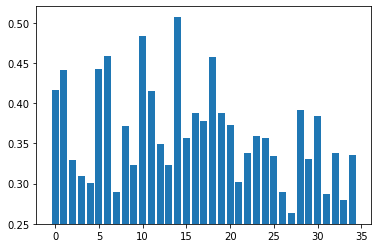

In [7]:
from sklearn.model_selection import cross_val_score
from sklearn import svm

classifiers = []
for i in range(ELECTRODES_NUM):
    classifiers.append([])
    for c in (0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1):
        classifiers[-1].append(svm.SVC(C=c))
    # classifiers.append(svm.SVC(C=c, kernel="sigmoid"))
k = 5
classifiers_len = len(classifiers[0])
scores = np.empty((ELECTRODES_NUM, classifiers_len))
for i in range(ELECTRODES_NUM):
    for j in range(classifiers_len):
        score = cross_val_score(classifiers[i][j], trimmed_train_ICs[i], train_labels, cv=k, scoring='f1_macro')
        scores[i,j] = score.mean()
scores = np.mean(scores, axis=1)
for i in range(ELECTRODES_NUM):
    print(f"For IC {i} the score is {scores[i]}.")
bottom = 0.25
x = np.arange(ELECTRODES_NUM)
plt.bar(x, scores-bottom, bottom=bottom)
print(f"The average score is {scores.mean()}.")

In [30]:
from sklearn.model_selection import cross_val_score
from sklearn import svm

k = 5
x = np.arange(ELECTRODES_NUM)
bottom = 0.25
idxs = range(ELECTRODES_NUM)
scores = np.zeros((ELECTRODES_NUM,ELECTRODES_NUM))
for idx1 in idxs:
    for idx2 in idxs:
        clf = svm.SVC(C=0.7)
        # Makes no difference:
        # if idx1 != idx2:
        #     selected = np.concatenate((train_ICs[idx1], train_ICs[idx2]), axis = 1)
        # else:
        #     selected = train_ICs[idx1]
        selected = np.concatenate((trimmed_train_ICs[idx1], trimmed_train_ICs[idx2]), axis = 1)
        scores[idx1,idx2] = cross_val_score(clf, selected, train_labels, cv=k).mean()
print(scores)

[[0.43098852 0.50429471 0.47430581 ... 0.46886338 0.40925583 0.46597556]
 [0.50429471 0.47697149 0.49055905 ... 0.49048501 0.45805257 0.47434284]
 [0.47430581 0.49055905 0.37671233 ... 0.38193262 0.4038134  0.40377638]
 ...
 [0.46886338 0.49048501 0.38193262 ... 0.36853017 0.360311   0.40640504]
 [0.40925583 0.45805257 0.4038134  ... 0.360311   0.32521288 0.39018882]
 [0.46597556 0.47434284 0.40377638 ... 0.40640504 0.39018882 0.36582747]]


In [31]:
import pandas as pd

## convert your array into a dataframe
scores_pandas_df = pd.DataFrame (scores)

## save to xlsx file
filepath = 'classifiers_accuracy/sep_4th/concat_trimmed.xlsx'

scores_pandas_df.to_excel(filepath, index=False)

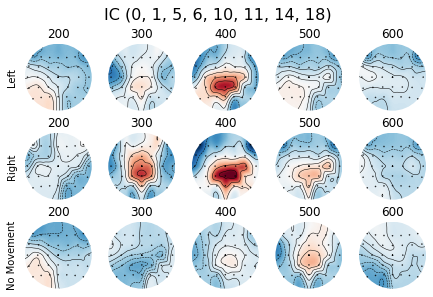

In [17]:
# Draw Topo Maps of reconstructed COMBINED ICs

time_idxs = np.array([50,100,150,200,250])
time_points = 2 * time_idxs + 100
TIME_POINTS_NUM = time_idxs.shape[0]

ics = (0,1,5,6,10,11,14,18)

fig, ax = plt.subplots(nrows = 3, ncols = TIME_POINTS_NUM, constrained_layout = True)
fig.suptitle(f"IC {ics}", fontsize = 16)
ax[0,0].set_ylabel('Left')
ax[1,0].set_ylabel('Right')
ax[2,0].set_ylabel('No Movement')
voltages = [
    obj_trimmed_train_left_reconstructed_8_ics.average().get_data()[:,time_idxs],
    obj_trimmed_train_right_reconstructed_8_ics.average().get_data()[:,time_idxs],
    obj_trimmed_train_no_move_reconstructed_8_ics.average().get_data()[:,time_idxs]
]
v_min = np.min(voltages)
v_max = np.max(voltages)
for i in range(TIME_POINTS_NUM):
    mne.viz.plot_topomap(obj_trimmed_train_left_reconstructed_8_ics.average().get_data()[:,time_idxs[i]], obj_trimmed_train_left_reconstructed_8_ics.info, vmin=v_min, vmax=v_max, axes=ax[0,i], show=False)
    ax[0,i].set_title(str(time_points[i]))
    mne.viz.plot_topomap(obj_trimmed_train_right_reconstructed_8_ics.average().get_data()[:,time_idxs[i]], obj_trimmed_train_right_reconstructed_8_ics.info, vmin=v_min, vmax=v_max, axes=ax[1,i], show=False)
    ax[1,i].set_title(str(time_points[i]))
    mne.viz.plot_topomap(obj_trimmed_train_no_move_reconstructed_8_ics.average().get_data()[:,time_idxs[i]], obj_trimmed_train_no_move_reconstructed_8_ics.info, vmin=v_min, vmax=v_max, axes=ax[2,i], show=False)
    ax[2,i].set_title(str(time_points[i]))

C:\Users\alonb\AppData\Local\Temp\ipykernel_23992\187906366.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows = 3, ncols = TIME_POINTS_NUM, constrained_layout = True)


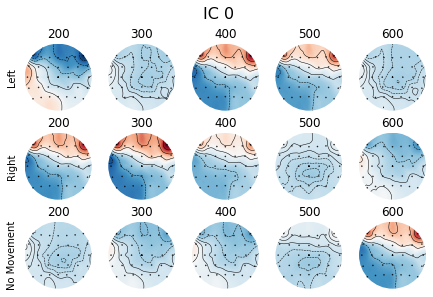

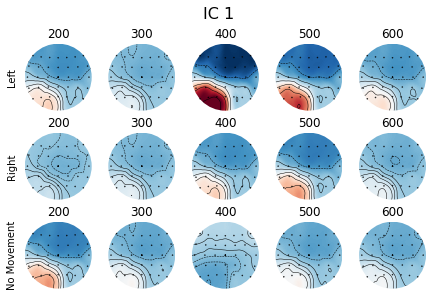

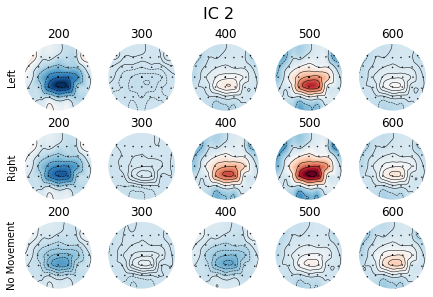

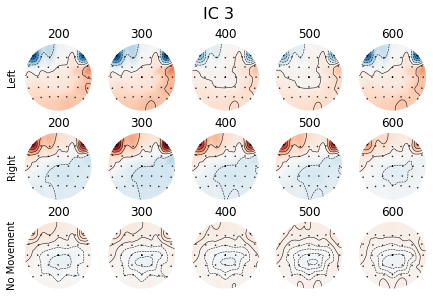

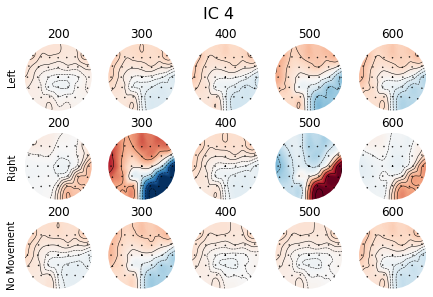

...

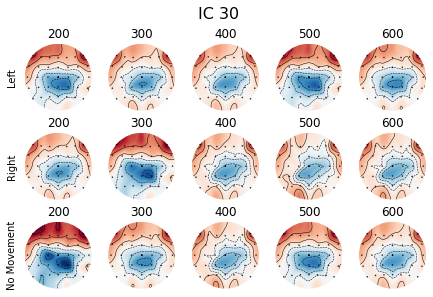

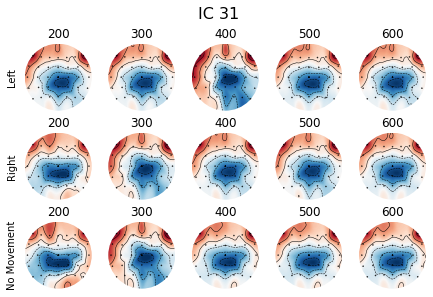

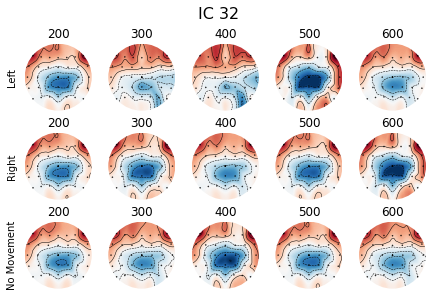

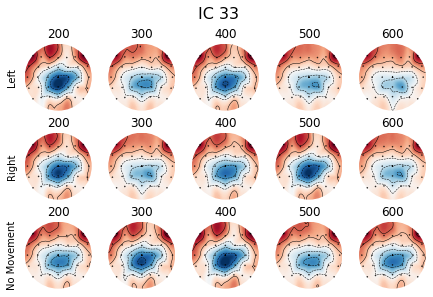

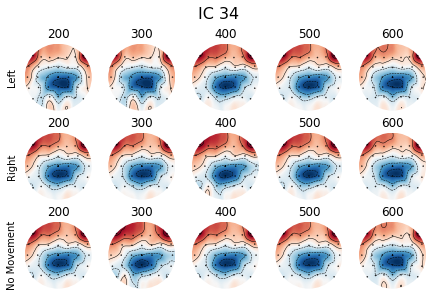

In [16]:
# Draw Topo Maps

time_idxs = np.array([50,100,150,200,250])
time_points = 2 * time_idxs + 100
TIME_POINTS_NUM = time_idxs.shape[0]

for ic in range(ELECTRODES_NUM):
    fig, ax = plt.subplots(nrows = 3, ncols = TIME_POINTS_NUM, constrained_layout = True)
    fig.suptitle(f"IC {ic}", fontsize = 16)
    ax[0,0].set_ylabel('Left')
    ax[1,0].set_ylabel('Right')
    ax[2,0].set_ylabel('No Movement')
    voltages = [train_left_reconstructed[ic,:,time_idxs],
                train_right_reconstructed[ic,:,time_idxs],
                train_no_move_reconstructed[ic,:,time_idxs]]
    v_min = np.min(voltages)
    v_max = np.max(voltages)
    for i in range(TIME_POINTS_NUM):
        mne.viz.plot_topomap(train_left_reconstructed[ic,:,time_idxs[i]], train_set_left.info, vmin=v_min, vmax=v_max, axes=ax[0,i], show=False)
        ax[0,i].set_title(str(time_points[i]))
        mne.viz.plot_topomap(train_right_reconstructed[ic,:,time_idxs[i]], train_set_right.info, vmin=v_min, vmax=v_max, axes=ax[1,i], show=False)
        ax[1,i].set_title(str(time_points[i]))
        mne.viz.plot_topomap(train_no_move_reconstructed[ic,:,time_idxs[i]], train_set_no_move.info, vmin=v_min, vmax=v_max, axes=ax[2,i], show=False)
        ax[2,i].set_title(str(time_points[i]))

C:\Users\alonb\AppData\Local\Temp\ipykernel_23992\1969638596.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows = 3, ncols = TIME_POINTS_NUM, constrained_layout = True)


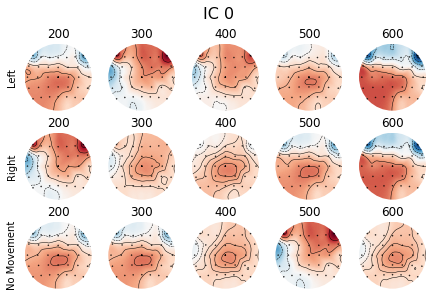

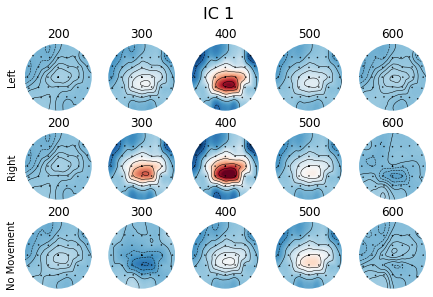

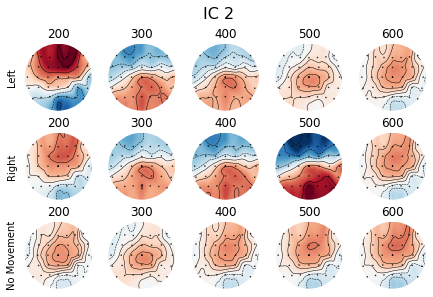

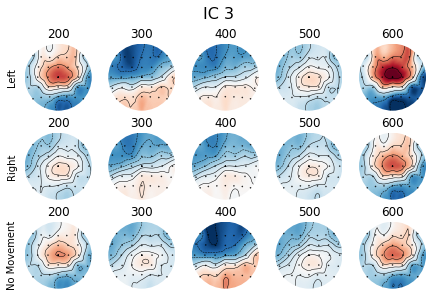

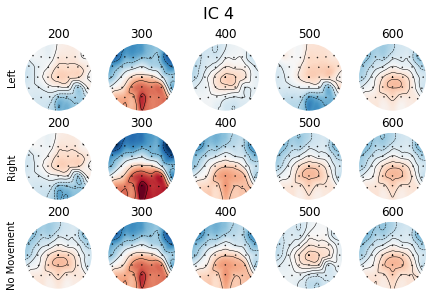

...

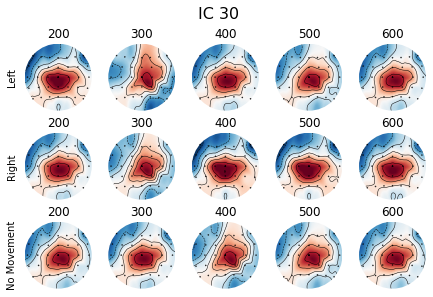

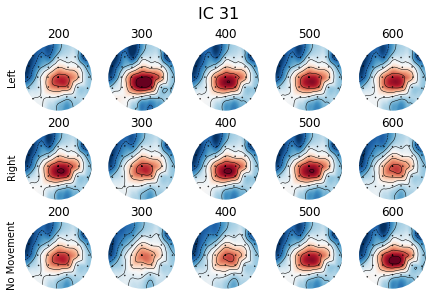

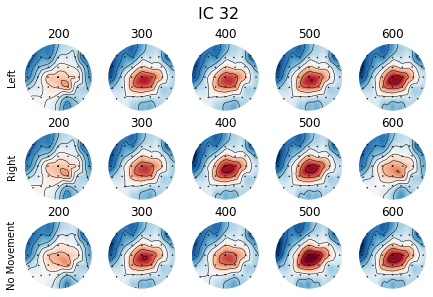

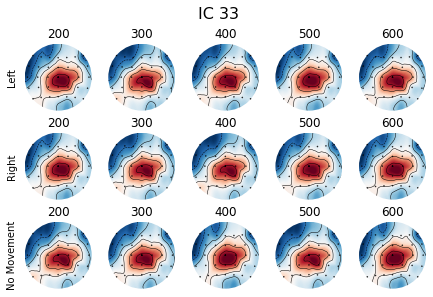

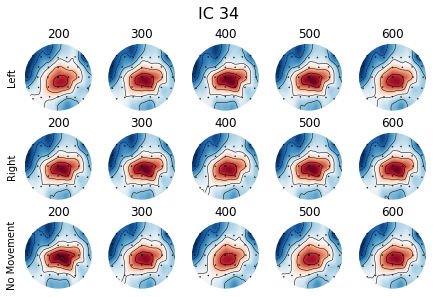

In [13]:
# Draw Topo Maps - TRIMMED

time_idxs = np.array([50,100,150,200,250])
time_points = 2 * time_idxs + 100
TIME_POINTS_NUM = time_idxs.shape[0]

for ic in range(ELECTRODES_NUM):
    fig, ax = plt.subplots(nrows = 3, ncols = TIME_POINTS_NUM, constrained_layout = True)
    fig.suptitle(f"IC {ic}", fontsize = 16)
    ax[0,0].set_ylabel('Left')
    ax[1,0].set_ylabel('Right')
    ax[2,0].set_ylabel('No Movement')
    voltages = [trimmed_train_left_reconstructed[ic,:,time_idxs],
                trimmed_train_right_reconstructed[ic,:,time_idxs],
                trimmed_train_no_move_reconstructed[ic,:,time_idxs]]
    v_min = np.min(voltages)
    v_max = np.max(voltages)
    for i in range(TIME_POINTS_NUM):
        # time_point = time_point_idx * 100 + 50
        mne.viz.plot_topomap(trimmed_train_left_reconstructed[ic,:,time_idxs[i]], trimmed_train_set_left.info, vmin=v_min, vmax=v_max, axes=ax[0,i], show=False)
        ax[0,i].set_title(str(time_points[i]))
        mne.viz.plot_topomap(trimmed_train_right_reconstructed[ic,:,time_idxs[i]], trimmed_train_set_right.info, vmin=v_min, vmax=v_max, axes=ax[1,i], show=False)
        ax[1,i].set_title(str(time_points[i]))
        mne.viz.plot_topomap(trimmed_train_no_move_reconstructed[ic,:,time_idxs[i]], trimmed_train_set_no_move.info, vmin=v_min, vmax=v_max, axes=ax[2,i], show=False)
        ax[2,i].set_title(str(time_points[i]))

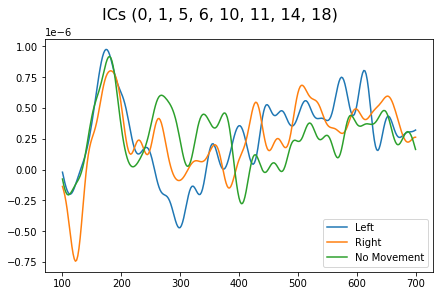

In [27]:
time_axis = range(100, 702, 2)
channel_name = ['Cz']
ics = (0,1,5,6,10,11,14,18)
# for ic in ics:
#     fig, ax = plt.subplots(nrows = 1, ncols = 1, constrained_layout = True)
#     fig.suptitle(f"IC {ic}", fontsize = 16)
#     ax.plot(time_axis, np.squeeze(obj_trimmed_train_left_reconstructed[ic].average().pick_channels(channel_name).get_data()), label='Left')
#     ax.plot(time_axis, np.squeeze(obj_trimmed_train_right_reconstructed[ic].average().pick_channels(channel_name).get_data()), label='Right')
#     ax.plot(time_axis, np.squeeze(obj_trimmed_train_no_move_reconstructed[ic].average().pick_channels(channel_name).get_data()), label='No Movement')
#     ax.legend()
    
fig, ax = plt.subplots(nrows = 1, ncols = 1, constrained_layout = True)
fig.suptitle(f"ICs {ics}", fontsize = 16)
ax.plot(time_axis, np.squeeze(obj_trimmed_train_left_reconstructed_8_ics.average().pick_channels(channel_name).get_data()), label='Left')
ax.plot(time_axis, np.squeeze(obj_trimmed_train_right_reconstructed_8_ics.average().pick_channels(channel_name).get_data()), label='Right')
ax.plot(time_axis, np.squeeze(obj_trimmed_train_no_move_reconstructed_8_ics.average().pick_channels(channel_name).get_data()), label='No Movement')
ax.legend()